### IMPORT

In [1]:
import os, sys
import matplotlib.pyplot as plt
import numpy as np
from torchvision.utils import make_grid
import torch

from PIL import ImageDraw, ImageFont
from IPython.display import Image, display
import torchvision.transforms as transforms
from torchvision.utils import save_image

In [2]:
sys.path.append(os.path.abspath('..'))
    
from src.save_load_model import load_model_img_gen
from src.backward_diffusion import sample

### VISU functions 

In [3]:
def visu_backward(imgs, timesteps_to_plot):
    imgs_select = [imgs[t] for t in timesteps_to_plot]

    for img, t in zip(imgs_select, timesteps_to_plot):
        fig, axes = plt.subplots(1, 2, figsize=(6, 3)) 
        
        # Plot left: sample at t
        axes[0].imshow(img.squeeze(), cmap='gray')
        axes[0].set_title(f"Timestep: {t}")
        axes[0].axis('off')

        # Plot right: pixel histogramm
        axes[1].hist(img.flatten(), bins=50, color='blue', alpha=0.7)
        axes[1].set_title(f"Histogram: {t}")

        plt.tight_layout()
        plt.show()

In [4]:
def im_stats(imgs, start_timestep, end_timestep):

    mean_values = []
    min_values = []
    max_values = []
    var_values = []

    for t in range(start_timestep, end_timestep+1):
        img = imgs[t]
        pixels = img.flatten()
        mean_values.append(np.mean(pixels))
        min_values.append(np.min(pixels))
        max_values.append(np.max(pixels))
        var_values.append(np.var(pixels))

    return mean_values, min_values, max_values, var_values


In [5]:
def grid_plot(imgs_batch, nrow=4):
    """
    Display a grid of images.
    """
    grid_img = make_grid(imgs_batch[-1], nrow=nrow, normalize=True, pad_value=1)

    plt.figure(figsize=(10, 10))
    plt.imshow(grid_img.permute(1, 2, 0).cpu().numpy(), cmap='gray')
    plt.axis("off")
    plt.show()
    return grid_img




In [6]:
#  GIF

# Rescale image helper
def rescale_image(tensor):
    scaled_tensor = (tensor - tensor.min()) / (tensor.max() - tensor.min() + 1e-5)
    return (scaled_tensor * 256).type(torch.uint8)

# Add frame number overlay
def add_frame_number(image, frame_number):
    draw = ImageDraw.Draw(image)
    font = ImageFont.truetype("arial.ttf", 30)
    draw.text((10, 10), f"t = {frame_number}", fill="white", font=font)
    return image

# Create backward diffusion GIF
def create_backward_gif(imgs, step=10, duration=50):
    gif_path = "backward.gif"
    to_pil = transforms.ToPILImage()
    images = [to_pil(rescale_image(img)) for img in imgs]
    images_with_numbers = [add_frame_number(img.copy(), i) for i, img in enumerate(images)]
    selected_images = images_with_numbers[::step] + [images_with_numbers[-1]]
    
    selected_images[0].save(
        gif_path,
        save_all=True,
        append_images=selected_images[1:],
        duration=duration,
        loop=1 
    )
    print(f"GIF saved as => {gif_path}")

### EXPO

#### load model and generate images

In [7]:
# Set parameters
model_name = 'Cosine_05'
batch_size = 9
nrow = 3

# model location
model_path = f'../results/models/{model_name}/{model_name}.pth'

model, config_params, diffusion_vars = load_model_img_gen(model_path)

timesteps = config_params['timesteps']
x_0_shape = (batch_size, 1, 256, 256)

print(f">>> Generating images")

# Perform reverse diffusion
imgs_batch = sample(model, x_0_shape, timesteps, diffusion_vars)

>>> Generating images


In [8]:
# Extract image batch (all timesteps)
batch = 0
imgs = [img[batch] for img in imgs_batch]

#### VISU

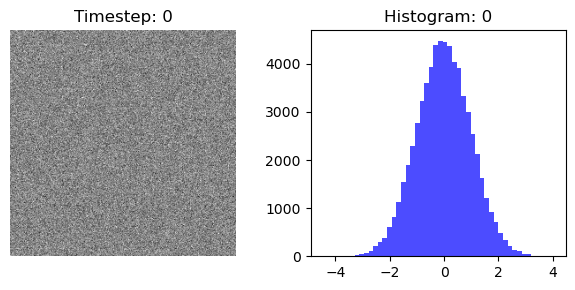

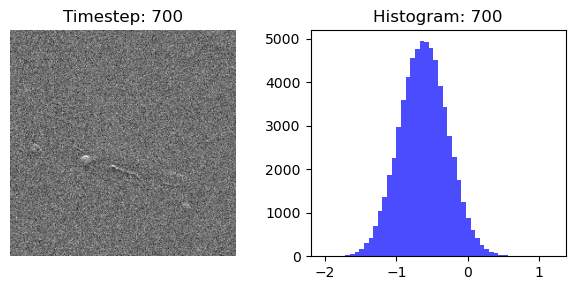

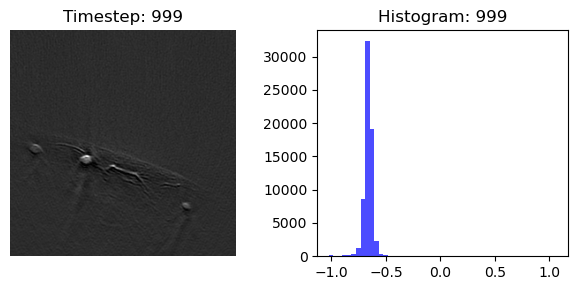

In [9]:
timesteps_to_plot = [0, 
                    timesteps//100 * 70,
                    timesteps-1] 
visu_backward(imgs, timesteps_to_plot)

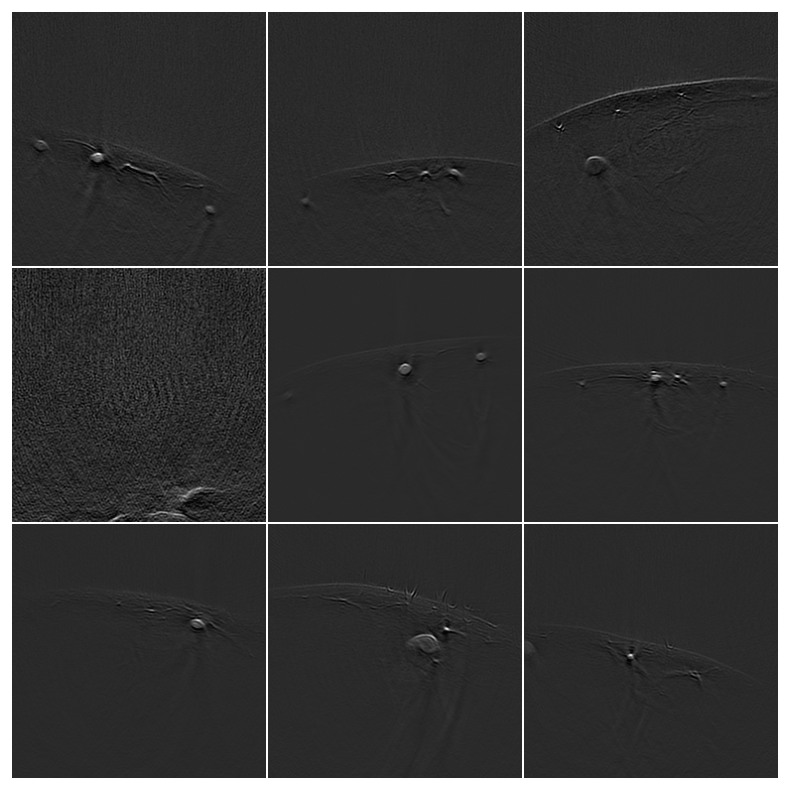

In [10]:
grid_img = grid_plot(imgs_batch, nrow=nrow)

In [11]:
# save_image(grid_img, f'f'../results/models/{model_name}/sample_grid.png')

### GIF

In [21]:
# Extract image batch (all timesteps)
batch = 0
imgs = [img[batch] for img in imgs_batch]

In [22]:
create_backward_gif(imgs, step=10, duration=150)

GIF saved as => backward.gif


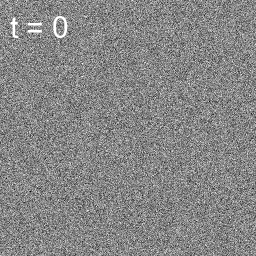

In [23]:
# Display the saved GIF
gif_path = "backward.gif"
display(Image(filename=gif_path))